In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Sound event localization and detection system

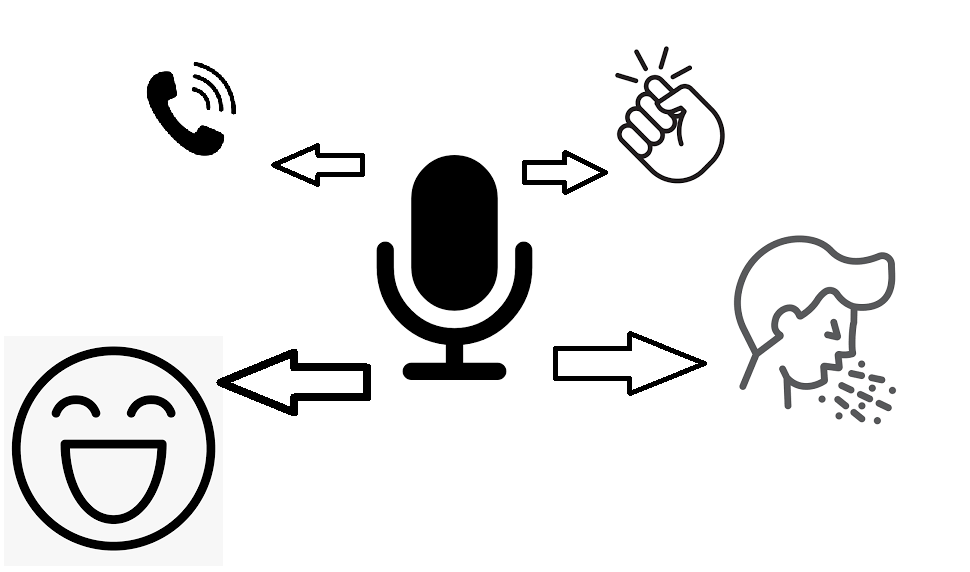

## Module

In [ ]:
%%capture
!pip install -U matplotlib, librosa
!pip install torchinfo
!cp "/content/drive/MyDrive/Colab Notebooks/capstone/utils.py" /content
!cp "/content/drive/MyDrive/Colab Notebooks/capstone/audio_scaler.pkl" /content

In [ ]:
import os
from datetime import datetime
import warnings
warnings.filterwarnings('ignore')

import IPython.display as ipd
import joblib
import librosa
import librosa.display
import matplotlib.pyplot as plt
plt.style.use('seaborn-v0_8-whitegrid')import os
from datetime import datetime
import warnings
warnings.filterwarnings('ignore')

import IPython.display as ipd
import joblib
import librosa
import librosa.display
import matplotlib.pyplot as plt
plt.style.use('seaborn-v0_8-whitegrid')
import numpy as np
import pandas as pd
import scipy.io.wavfile as wav
from sklearn import preprocessing
import torch
from torchinfo import summary
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from tqdm import tqdm

from utils import Audio2Vector, TimeDistributed
import numpy as np
import pandas as pd
import scipy.io.wavfile as wav
from sklearn import preprocessing
import torch
from torchinfo import summary
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from tqdm import tqdm

from utils import Audio2Vector, TimeDistributed

## Parameter

In [ ]:
fs = 48000
fs_s = fs//4 # for plot or resample, use small value
hop_len = 960 # fs // 50
frame_res = 50 # fs // hop_len
nb_frames_1s = frame_res
audio_max_len_samples = 60 * fs # playtime of audio in datasets is in 60s
max_frames = 3000 # int(np.ceil(audio_max_len_samples / float(hop_len)))

win_len = 1920 # 2 * hop_len

# nfft is recommended to put in a power of 2 for optimizing the speed of the fast Fourier transform algorithm
nfft = 2048 # 2048 is a minimal power of 2, satifying with nfft > win_len
nb_channels = 4 # audio has 4 channels

cls2idx = {
    'clearthroat': 2,
    'cough': 8,
    'doorslam': 9,
    'drawer': 1,
    'keyboard': 6,
    'keysDrop': 4,
    'knock': 0,
    'laughter': 10,
    'pageturn': 7,
    'phone': 3,
    'speech': 5
}
idx_to_classes = {str(val): key for key, val in cls2idx.items()}

## Dataset

_Data Description_  
 - 48000Hz로 샘플링한 1분 길이의 오디오
 - 4 채널을 통해 녹음하였다. (Quadraphonic)  
 - 11가지의 클래스를 가진다.
 - 사실적인 녹음을 위해 주변 소음을 합성하여 평균 SNR이 30dB이 되도록 한다.
 - 소리의 종류와 소리의 발생 위치를 Label로 한다. 이 때, 발생 위치는 구좌표계를 사용한다.

___데이터 수집___  

_dist(distance), 거리_  
_ele(elevation), 고도_  
_azi(azimuth), 방위각_  
 - Eigenmike에서 1m 떨어진 거리에서 10° 간격으로 -40° ~ 40°, 총 9개의 고도에 대해 10° 방위각 36개의 IR(Impulse Response)로 324개의 개별 DOA 생성  
 - Eigenmike에서 2m 떨어진 거리에서 10° 간격으로 -20° ~ 20°, 총 5개의 고도에 대해 10° 방위각 36개의 IR로 180개의 개별 DOA 생성  

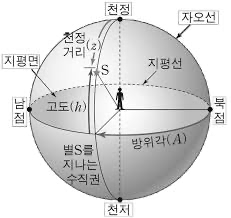

_데이터의 수집은 서로 다른 5개의 실내 위치에서 수집되었다._
 - Language Center: 여러 개의 좌석 테이블과 카펫 바닥이 있는 넓은 공용 공간. 사람들이 대화하며 일하고 있음.  
 - Reaktori Building: 여러 개의 좌석 테이블과 카페 바닥이 있는 대형 카페테리아. 사람들이 대화하며 음식을 먹고 있음.  
 - Festia Building: 단단한 바닥이 있는 높은 천장 복도. 사람들이 돌아다니며 대화하고 있음.  
 - Tietotalo Building: 주변에 교실이 있고 단단한 바닥이 있는 복도. 사람들이 돌아다니며 대화하고 있음.  
 - Sahkotalo Building: 여러 개의 소파와 테이블이 있는 넓은 복도. 서로 다른 부분의 단단한 카펫 바닥. 사람들이 돌아다니며 대화하고 있음.

_Ambisonic microphone_

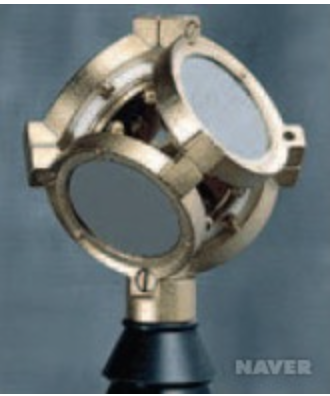

### sample
___Preprocessing___

In [ ]:
# 오디오 파일 경로로부터 오디오와 대응되는 넘파이 배열로 불러옵니다.
# 오디오의 길이가 60초에 맞도록 만듭니다. 짧으면 zero padding을 진행하고 길면 자릅니다.
# 배열의 각 원소는 실수형 데이터 타입입니다.
def load_audio(audio_path):
    audio, _ = librosa.load(audio_path, fs, mono=False)
    len_aud = audio.shape[1]
    if len_aud < audio_max_len_samples:
        zero_pad = np.zeros((4, audio_max_len_samples - len_aud))
        audio = np.hstack((audio, zero_pad))
    elif len_aud > audio_max_len_samples:
        audio = audio[:, :audio_max_len_samples]
    return audio

In [ ]:
# 샘플과 라벨의 경로를 불러옵니다.
# s_ means sample
s_path = '/content/drive/MyDrive/Colab Notebooks/capstone/sample.wav'
s_df_path = '/content/drive/MyDrive/Colab Notebooks/capstone/sample_df.csv'

# 샘플 오디오의 넘파이 배열 shape을 확인합니다.
s = load_audio(s_path)
s.shape

(4, 2880000)

In [ ]:
# 샘플 오디오의 배열 최대, 최소값입니다.
s.max(), s.min()

(0.02911376953125, -0.031280517578125)

#### play audio

In [ ]:
# 샘플 오디오를 실제로 재생합니다.
# for using small memories, take a short sample rate
s_resample = librosa.resample(s, fs, fs_s)
ipd.Audio(s_resample, rate=fs_s)

#### plot the sample

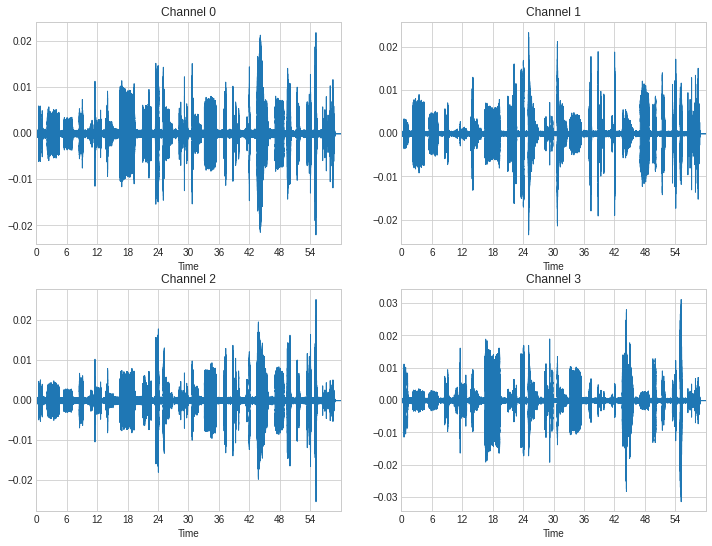

In [ ]:
# 샘플 오디오를 각 채널마다 시각화합니다.
_, axes = plt.subplots(2, 2, figsize=(12, 9))
axes = axes.flatten()
for idx, ax in enumerate(axes):
  librosa.display.waveplot(s[idx], sr=fs, ax = ax)
  ax.set_title(f'Channel {idx}')

#### plot spectrogram of sample
___Short Time Fourier Transform___

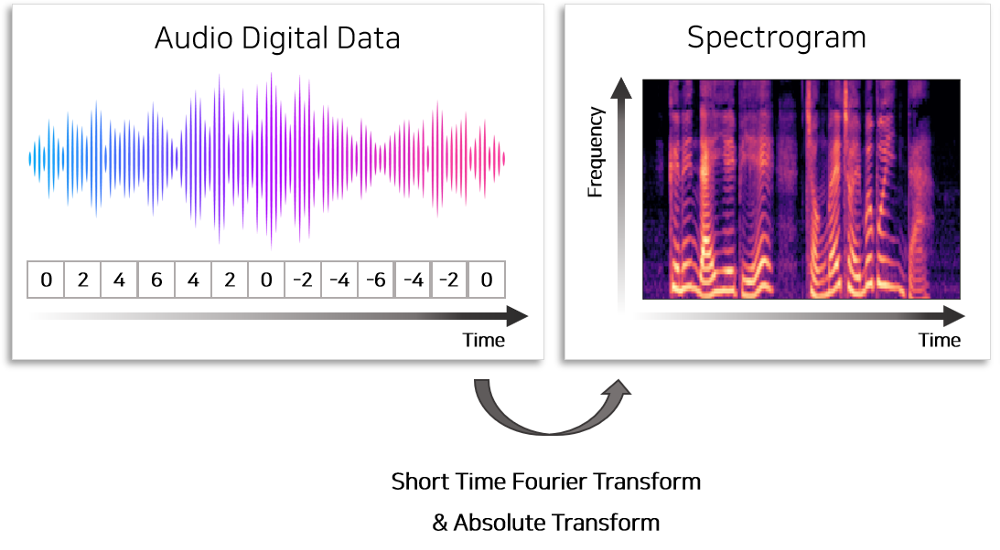

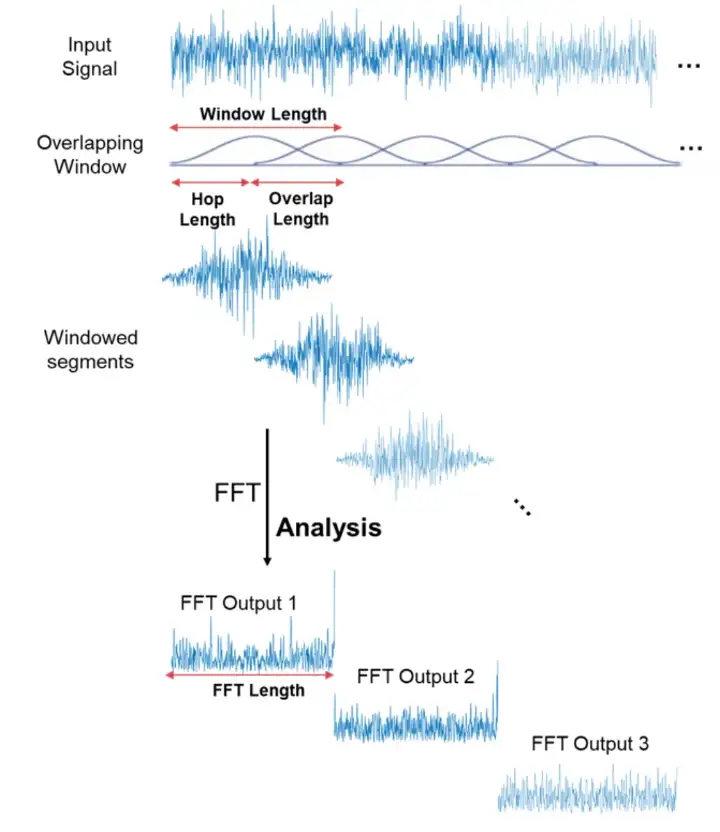

 - Window Length: 하나의 프레임이 가지는 샘플의 개수  
 - Hop Length: 프레임과 이웃 프레임과의 샘플링 간격  
 - Window type: hann
    - 정상적인 연속 데이터 분석 시 사용
    - 일반적 진동 해석에 적용
    - 진폭치는 정확하지 않아도 정확한 진동수를 구별할 때

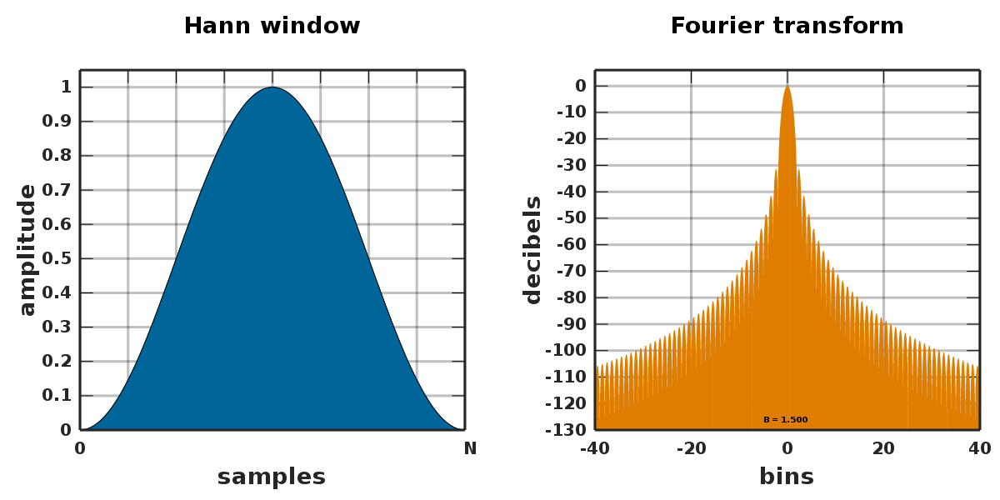

___The reason why we should apply for 'hann' windows___  
_refered as https://stackoverflow.com/questions/5418951/what-is-the-hamming-window-for_  

퓨리어 변환을 할 때, 실제 사인 곡선은 무한한 영역에서 존재합니다. 하지만 머신이 연산하는 과정에서 유한한 영역으로 자르게 되고, 그로 인한 ripple 현상이 생깁니다. hann window는 이 ripple을 제거하는 용도로 사용됩니다.

In [ ]:
# 불러온 샘플 오디오 배열에 Short Time Fourier Transform을 적용합니다.
# 3rd party Library librosa.stft
def spectrogram(audio_input):
    nb_freq = nfft // 2 # 표본화 정리(nyquist shannon sampling theorem)
    spectra = np.zeros((nb_channels, max_frames, nb_freq), dtype=complex)
    for ch in range(nb_channels):
        stft_ch = librosa.stft(audio_input[ch, :], n_fft=nfft, hop_length=hop_len,
                                    win_length=win_len, window='hann')
        # 채널 별로 STFT를 적용한 출력을 spectra 배열에 저장합니다.
        spectra[ch, :, :] = stft_ch[1:, :max_frames].T
    return spectra

In [ ]:
# 샘플 오디오 배열을 스펙트로그램으로 변환합니다.
# 변환된 스펙트로그램 역시 넘파이 배열이며 shape은 다음과 같습니다.
s_spectra = spectrogram(s)
s_spectra.shape

(4, 3000, 1024)

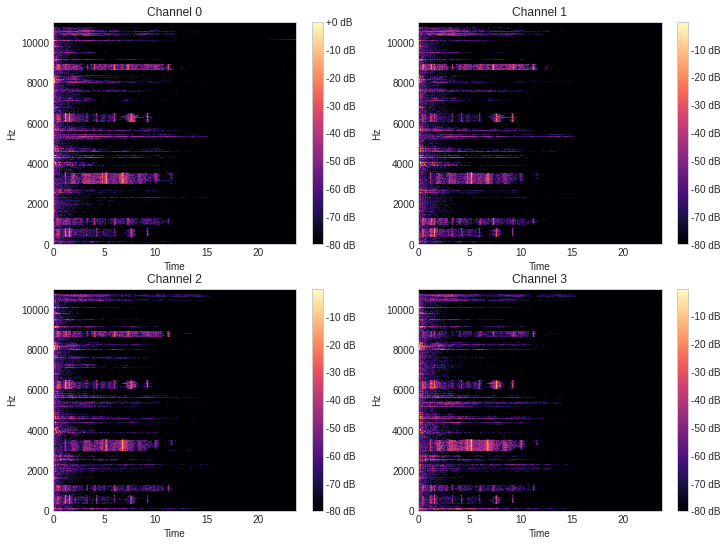

In [ ]:
# 샘플 스펙트로그램을 시각화합니다.
# x, y축은 각각 시간축과 주파수축입니다.
# 이 역시 각 채널 별로 시각화합니다.
s_db = librosa.amplitude_to_db(np.abs(s_spectra), ref=np.max)

fig, axes = plt.subplots(2, 2, figsize=(12, 9))
axes = axes.flatten()
for idx, ax in enumerate(axes):
  img = librosa.display.specshow(s_db[idx, :, :], x_axis='time', y_axis='linear', ax=ax)
  ax.set_title(f'Channel {idx}')
  fig.colorbar(img, ax=ax, format="%+2.f dB")

## Model

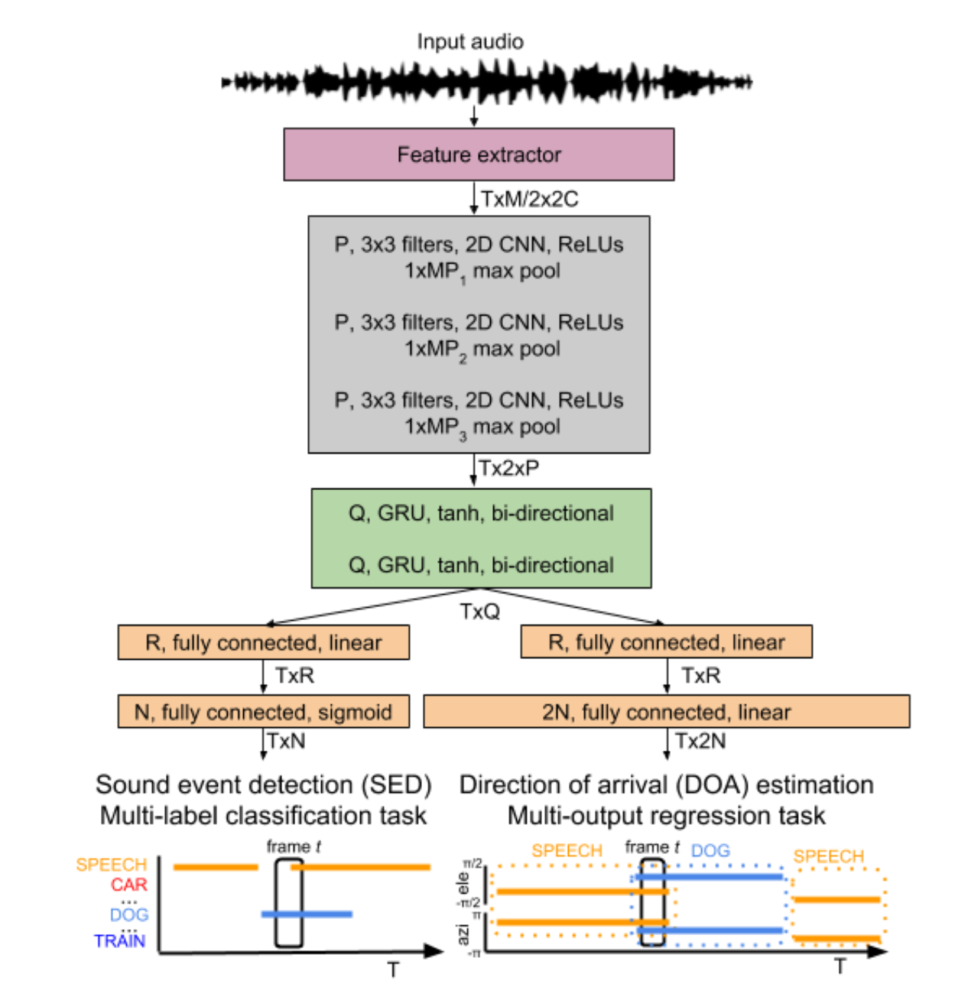

In [ ]:
class Network(nn.Module):
    def __init__(self):
        super().__init__()
        self.cnn_input_channels = 4
        self.cnn_output_channels = 64
        self.rnn_seq_len = 150

        # CNN
        pool_sizes = 8, 8, 4
        self.layers = []
        for pool_size in pool_sizes:
            self.layers.append(self._CNN_make_layer(pool_size))
        self.CNN = nn.Sequential(*self.layers)

        # RNN
        rnn_input_shape = 256
        self.GRU = nn.GRU(rnn_input_shape, self.rnn_seq_len, num_layers=2, batch_first=True, bidirectional=True)

        # SED
        num_cls = 11
        self. SED_fc = nn.Linear(2*self.rnn_seq_len, num_cls)

        # DOA
        # each azi, ele have 11 classes
        # so total classes is 22
        num_cls = 22
        self. DOA_fc = nn.Linear(2*self.rnn_seq_len, num_cls)


    def _CNN_make_layer(self, pool_size):
        layer = nn.Sequential(
            nn.Conv2d(self.cnn_input_channels, self.cnn_output_channels, kernel_size=3, padding="same", bias=False),
            nn.BatchNorm2d(self.cnn_output_channels),
            nn.ReLU(),
            nn.MaxPool2d((1, pool_size)),
            nn.Dropout()
        )
        self.cnn_input_channels = self.cnn_output_channels
        return layer

    def forward(self, x):
        x = self.CNN(x)
        # for make tensor's shape (batch_size, 3000, 64, 4)
        x = x.permute(0, 2, 1, 3)
        # (20, 150, 256)
        x = x.reshape(20, 150, -1)
        # GRU(x)[0].shape is (20, 150, 300)
        # 300 = self.rnn_seq_len * 2 (bidirectional)
        x = self.GRU(x)[0]
        sed = TimeDistributed(self.SED_fc)(x).reshape(1, 3000, -1)
        doa = TimeDistributed(self.DOA_fc)(x).reshape(1, 3000, -1)
        return sed, doa

In [ ]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'
model = Network()

In [ ]:
summary(model, (1, 4, 3000, 1024))

Layer (type:depth-idx)                   Output Shape              Param #
Network                                  [1, 3000, 11]             --
├─Sequential: 1-1                        [1, 64, 3000, 4]          --
│    └─Sequential: 2-1                   [1, 64, 3000, 128]        --
│    │    └─Conv2d: 3-1                  [1, 64, 3000, 1024]       2,304
│    │    └─BatchNorm2d: 3-2             [1, 64, 3000, 1024]       128
│    │    └─ReLU: 3-3                    [1, 64, 3000, 1024]       --
│    │    └─MaxPool2d: 3-4               [1, 64, 3000, 128]        --
│    │    └─Dropout: 3-5                 [1, 64, 3000, 128]        --
│    └─Sequential: 2-2                   [1, 64, 3000, 16]         --
│    │    └─Conv2d: 3-6                  [1, 64, 3000, 128]        36,864
│    │    └─BatchNorm2d: 3-7             [1, 64, 3000, 128]        128
│    │    └─ReLU: 3-8                    [1, 64, 3000, 128]        --
│    │    └─MaxPool2d: 3-9               [1, 64, 3000, 16]         --
│    │

## Train

### Environment

python: 3. 10. 8  
pytorch: 1. 13. 0  
librosa: 0. 9. 2  
numpy: 1. 23. 5  
matplotlib: 3. 6. 2


### Tree

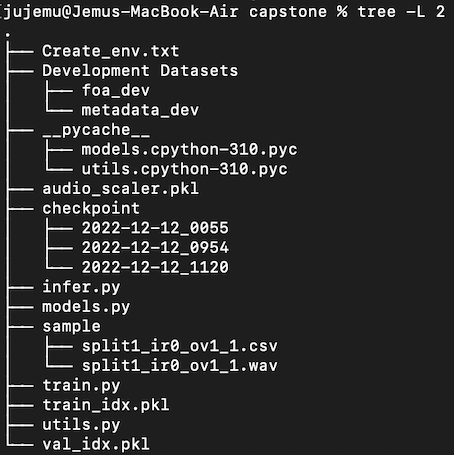

 - ___Create_env.txt___  
학습에 필요한 환경을 구성하기 위해서 Anaconda를 이용해 가상환경을 구축합니다.  
이때 필요한 파이썬과 필요한 라이브러리의 버전을 맞춥니다.  

 - ___Development Datasets___  
학습에 필요한 training datasets입니다.  
foa_dev에 wav 파일이 들어있고 metadata에 wav 파일에 맞는 label csv 파알이 들어있습니다.  

 - ___audio_scaler.pkl___  
학습과 추론에 필요한 정규화에 사용되는 pickle 파일입니다.  

 - ___checkpoint___  
학습이 진행되면서 model weight를 저장하는 폴더입니다.  
폴더의 이름은 학습 시작 시간을 의미합니다.  

 - ___infer.py___  
추론에 사용되는 python script입니다.  

 - ___models.py___  
딥러닝 모델 Network가 구현된 script입니다.  

 - ___sample___  
간단한 추론을 진행할 수 있는 sample 폴더입니다.  

 - ___train.py___  
학습이 진행되는 script입니다.  

 - ___train_idx.pkl, val_idx.pkl___  
교차검증을 위한 train dataset, validation dataset의 index array pickle 파일입니다.  

 - ___utils.py___  
dataset generator 정의와 학습 결과를 보여주는 plot_aud_cls, metric이 정의되어 있습니다.

그 외 \_\_pycache__ 는 파이썬 스크립트 실행 시 자동으로 만들어지는 cache입니다.

### Loss function

#### SED Loss
___MultiLabelSoftMarginLoss___

_Creates a criterion that optimizes a multi-label one-versus-all loss based on max-entropy, between input  x x and target  y y of size  ( N , C ) (N,C)_   

_For each sample in the minibatch_

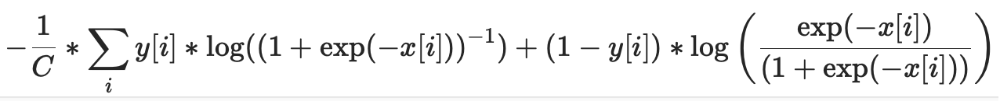

#### DOA Loss
___MSE Loss___

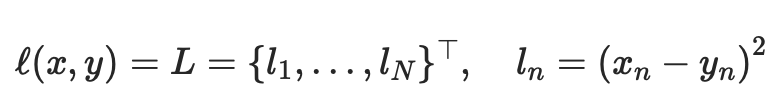

In [ ]:
# Loss function을 선언합니다.
sed_criterion = nn.MultiLabelSoftMarginLoss()
doa_criterion = nn.MSELoss()

### Training Loop

## Inference

In [ ]:
# 추론을 위해서 학습된 모델의 가중치를 불러옵니다.
model_weight_path = '/content/drive/MyDrive/Colab Notebooks/capstone/10_model_weight.pkl'
model.load_state_dict(torch.load(model_weight_path))
model = model.to(device, dtype=torch.float64)

In [ ]:
def infer(aud_path):
  # 추론할 샘플 데이터를 전처리하기 위해서 Audio2Vector 객체로 선언합니다.
  # 데이터셋이 아니라 단일 데이터를 입력으로 합니다.
  # 입력은 오디오 파일의 경로로 합니다.
  sample_ds = Audio2Vector(sample_path=aud_path, is_sample=True)
  sample_loader = DataLoader(sample_ds, 1)
  for sample in sample_loader:
      sample = sample.to(device)

      # 모델의 추론값을 Sound Event Detection과 Direction Of Arrival로 따로 저장합니다
      sed, doa = model(sample)

      # Tensor로 이루어진 추론값을 넘파이 배열로 바꿉니다.
      sed = sed.squeeze().cpu().detach().numpy()
      doa = doa.squeeze().cpu().detach().numpy()

  # 결과를 확인하기 위해서 추론값을 pickle파일로 저장합니다.
  sed_output_path, doa_output_path = 's_sed_infer.pkl', 's_doa_infer.pkl'
  print(f'inference of sample is dumped in [{sed_output_path}, {doa_output_path}]')
  joblib.dump(sed, sed_output_path)
  joblib.dump(doa, doa_output_path)

  return sed_output_path, doa_output_path

In [ ]:
# 위에서 정의한 추론 함수에 샘플 오디로 경로를 입력으로 하여
# 추론값을 저장합니다.
s_sed_infer_path, s_doa_infer_path = infer(s_path)

inference of sample is dumped in [s_sed_infer.pkl, s_doa_infer.pkl]


### Result

#### SED
___Soudn Event Detection___

In [ ]:
# 추론값의 label 시간 값을 정리합니다.
# 오디오 재생이 60초를 넘기면 끊어내고
# 넘파이 배열과 대응될 수 있도록 3000frame에 맞게 변환합니다.
# 시간값에 60초의 시간 값이 3000(정수만)에 대응되도록 50을 곱한 뒤 반올림합니다.
# 50은 frame resolution, 1초를 hop length로 나누었을 때의 값입니다.
def preprocess_df(df):
    df = df[df.start_time <= 60.]
    df.loc[:, 'end_time'] = df.end_time.apply(lambda x: 60. if x>60. else x)
    df.start_time = np.round(df.start_time * 50).astype(np.uint32)
    df.end_time = np.round(df.end_time * 50).astype(np.uint32)
    return df

In [ ]:
# 추론값과 정답을 비교하기 위해서 시각화합니다.
def plot_aud_cls(df_path, infer):
    plt.style.use('seaborn-v0_8-whitegrid')
    # list sorted by index
    cls_arr = sorted([(key, val) for key, val in cls2idx.items()], key=lambda x: x[1])
    cls_arr = [item[0] for item in cls_arr]

    # csv파일(label)을 시간대 별 클래스를 넘파이 배열로 만들어
    # 이미지로 그립니다.
    SIZE = (3000, 11*100)
    df = preprocess_df(pd.read_csv(df_path))
    aud_arr = np.zeros(SIZE)
    for _, row in df.iterrows():
        cls, start, end, ele, azi, _ = row
        cls_index = cls2idx[cls]
        aud_arr[start: end, cls_index*100:(cls_index+1)*100] = 1

    if infer.ndim >= 3:
        infer = infer.squeeze()

    infer_arr = np.zeros(SIZE)
    for idx, _ in enumerate(cls2idx):
        infer_arr[:, idx*100:(idx+1)*100] = np.expand_dims(infer[:, idx], 1)

    _, ax = plt.subplots(2, 1, figsize=(14, 10))
    ax[0].set_title('Label')
    ax[0].imshow(aud_arr.T, cmap='gray')
    ax[0].set_yticks(range(50, 1150, 100), cls_arr)
    ax[1].set_title('Inference')
    ax[1].imshow(infer_arr.T, cmap='gray')
    ax[1].set_yticks(range(50, 1150, 100), cls_arr)
    plt.show()

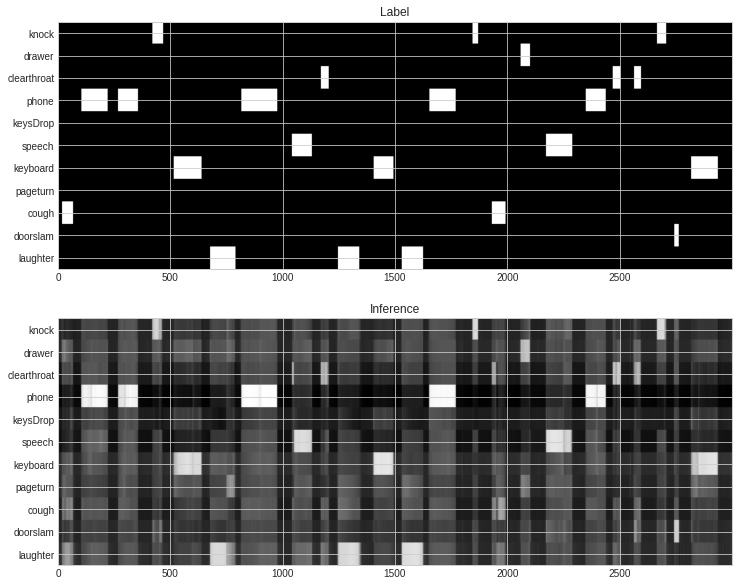

In [ ]:
s_sed_infer = joblib.load(s_sed_infer_path)
plot_aud_cls(s_df_path, s_sed_infer)

#### DOA
___Direction Of Arrival___

In [ ]:
# s_doa_infer shape
# (frame, (azi + ele))
s_doa_infer = joblib.load(s_doa_infer_path)
s_doa_infer.shape

(3000, 22)

In [ ]:
def get_doa(index):
  example = s_df.loc[index, :]
  start, end = example.start_time, example.end_time
  index_of_cls = cls2idx[example.sound_event_recording]

  e_azi = s_doa_infer[start:end, index_of_cls].mean()
  e_azi /= np.pi / 180
  e_ele = s_doa_infer[start:end, index_of_cls+11].mean()
  e_ele /= np.pi / 50

  return e_ele, e_azi

In [ ]:
s_df = preprocess_df(pd.read_csv(s_df_path))
del s_df['dist']

In [ ]:
for idx, _ in s_df.iterrows():
  ele_infer, azi_infer = get_doa(idx)
  s_df.loc[idx, 'ele_infer'], s_df.loc[idx, 'azi_infer'] = ele_infer, azi_infer

In [ ]:
s_df

,sound_event_recording,start_time,end_time,ele,azi,ele_infer,azi_infer
0,cough,18,67,-10,-10,6.779704,-7.006050
1,phone,104,221,-20,-70,3.712750,2.712528
2,phone,267,356,10,-120,3.236641,-5.857437
3,knock,420,468,10,140,16.234752,-2.118442
4,keyboard,515,639,30,-180,0.795548,-5.174487
5,laughter,677,790,-10,130,6.076852,-14.407800
6,phone,816,976,10,20,-4.331798,-9.340146
7,speech,1041,1130,20,-70,8.339049,-4.764889
8,clearthroat,1170,1205,-10,140,13.653508,-8.385274
9,laughter,1246,1341,-10,130,-0.132105,-11.053770


### Metric

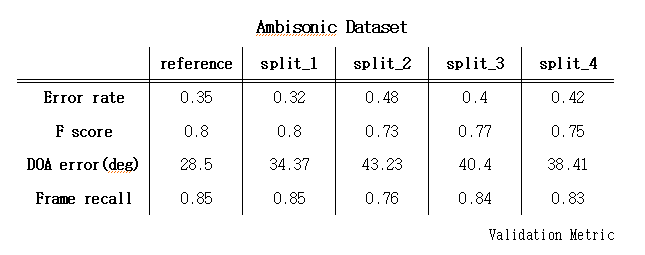

SED loss : multi lable classification  
DOA loss : MSE

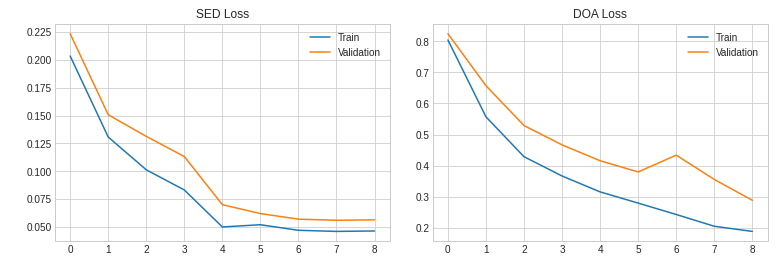

# 고찰

1. 현재는 구동되지 않는 keras_model.py, SELD.py를 최신버전으로 수정하였다.  
2. keras로 중심으로 작성된 프로젝트를 pytorch로 재표현하여 전체 script를 경량화하였다.  
3. 오디오 파일을 분석할 때, STFT을 사용해서 frame별 FFT를 이용하고 해석할 수 있다.  
4. CNN - RNN을 통해 시간 - 주파수 이미지의 특징을 추출하고 순환 신경망을 이용해 시계열 데이터를 해석할 수 있다.  
5. 오디오 데이터셋(multi label, multi class) 과제에서 적절한 loss function과 optimizer를 통해 학습하고 이를 시각화 할 수 있다.  
6. F1-score와 Error-rate를 통해 학습된 결과를 검증할 수 있다.